In [42]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import time
from scipy import fftpack
from scipy.integrate import odeint

### Problem 3 ————黄家乐

I'd like to use approximating fourier transform to solve this problem.

#### Question 1

For first derivative we have:
$$
\begin{align}
\psi' = \frac{2\pi i}{N^2\Delta x}\sum^{N-1}_{n=0}\sum^{N-1}_{m=0}(m-a)\psi_ne^{2\pi i(m-a)(l-n)/N}
\end{align}
$$

In [30]:
# define the properties
N = 256
a = (N - 1 ) / 2
halfL = 5
dx = (halfL - (-halfL)) / (N - 1)

# define the x-grid and discretised wavefunction
x = np.linspace(-halfL, halfL+dx, N)
alpha = 1
psi = (4 * alpha ** 3) / (np.pi) * np.exp((-alpha * x ** 2 ) / 2 )

# create the 3-dimensional Fourier diff matrix
l = np.arange(N).reshape((-1,1,1))
n = np.arange(N).reshape((1,-1,1))
m = np.arange(N).reshape((1,1,-1))
W = np.exp(2j*np.pi*(m-a)*(l-n)/N)

# perform the Fourier differentiation
psi_for_fft_diff = psi.reshape(1,-1,1)
dpsi = np.sum((2j*np.pi)/(dx*N**2) * psi_for_fft_diff * (m-a) * W, axis=(1,2))


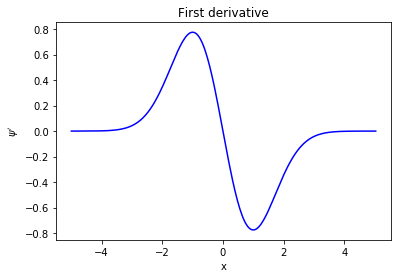

In [4]:
# Plot the figure
plt.plot(x,np.real(dpsi),'b')
plt.xlabel("x")
plt.ylabel(r"$\psi' $")
plt.title('First derivative')
plt.show()

#### Question 2

For second derivative we have:
$$
\begin{align}
\psi'' = & \frac{2\pi i}{N^2\Delta x}\sum^{N-1}_{n=0}\sum^{N-1}_{m=0}(m-a)\psi'_ne^{2\pi i(m-a)(l-n)/N}
\end{align}
$$

In [5]:
# perform the Fourier differentiation
psi_for_fft_diff = dpsi.reshape(1,-1,1)
ddpsi = np.sum((2j*np.pi)/(dx*N**2) * psi_for_fft_diff * (m-a) * W, axis=(1,2))

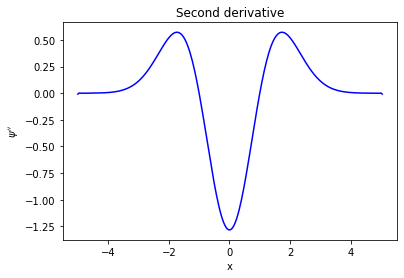

In [6]:
# Plot the figure
plt.plot(x,np.real(ddpsi),'b')
plt.xlabel("x")
plt.ylabel(r"$\psi'' $")
plt.title('Second derivative')
plt.show()

#### Question 3 

#### First, we define the maximum error function.

In [7]:
# Define the abs error function
def max_error_f(N):
    # define the properties
    a = (N - 1 ) / 2
    halfL = 5
    dx = (halfL - (-halfL)) / (N - 1)

    # define the x-grid and discretised wavefunction
    x = np.linspace(-halfL, halfL+dx, N)
    alpha = 1
    psi = (4 * alpha ** 3) / (np.pi) * np.exp((-alpha * x ** 2 ) / 2 )

    # create the 3-dimensional Fourier diff matrix
    l = np.arange(N).reshape((-1,1,1))
    n = np.arange(N).reshape((1,-1,1))
    m = np.arange(N).reshape((1,1,-1))
    W = np.exp(2j*np.pi*(m-a)*(l-n)/N)

    # perform the Fourier differentiation for first
    psi_for_fft_diff = psi.reshape(1,-1,1)
    dpsi = np.sum((2j*np.pi)/(dx*N**2) * psi_for_fft_diff * (m-a) * W, axis=(1,2))
    dpsi_exact = alpha * (-1) * x * psi
    
    # perform the Fourier differentiation for second
    psi_for_fft_diff = dpsi.reshape(1,-1,1)
    ddpsi = np.sum((2j*np.pi)/(dx*N**2) * psi_for_fft_diff * (m-a) * W, axis=(1,2))
    ddpsi_exact = alpha * (-1) * ( psi + x * dpsi_exact)

    # calculate error
    error_1st = np.max(abs(dpsi_exact - dpsi))
    error_2nd = np.max(abs(ddpsi_exact - ddpsi))

    return error_1st,error_2nd

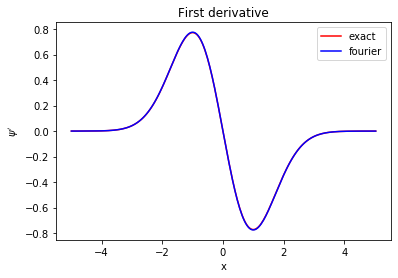

In [10]:
# Plot the figure
dpsi_exact = alpha * (-1) * x * psi
plt.plot(x,dpsi_exact,'r')
plt.plot(x,np.real(dpsi),'b')
plt.xlabel("x")
plt.ylabel(r"$\psi' $")
plt.title('First derivative')
plt.legend(['exact','fourier'])
plt.show()

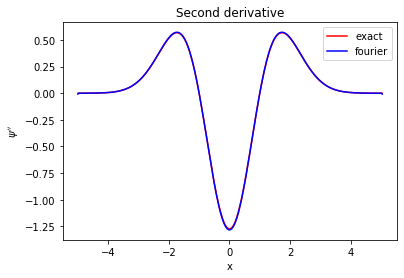

In [11]:
# Plot the figure
ddpsi_exact = alpha * (-1) * ( psi + x * dpsi_exact)
plt.plot(x,ddpsi_exact,'r')
plt.plot(x,np.real(ddpsi),'b')
plt.xlabel("x")
plt.ylabel(r"$\psi'' $")
plt.title('Second derivative')
plt.legend(['exact','fourier'])
plt.show()

As we can see from the two graphs above, the first and second derivatives we calculated agree well with the real values.

In [12]:
N = np.arange(200,300,2)
error_max_1st = []
error_max_2nd = []
for i in N:
    error_max_1st.append(max_error_f(i)[0])
    error_max_2nd.append(max_error_f(i)[1])

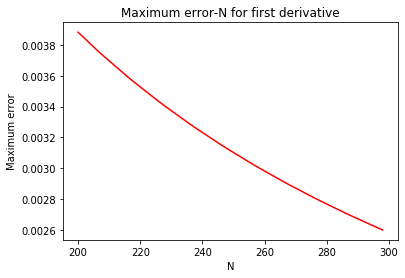

In [56]:
plt.plot(N,error_max_1st,'r')
plt.xlabel('N')
plt.ylabel('Maximum error')
plt.title('Maximum error-N for first derivative')
plt.show()

For the first derivative, the larger the value of N, the smaller the maximum error we get.

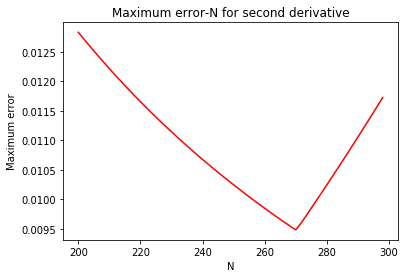

In [58]:
plt.plot(N,error_max_2nd,'r')
plt.xlabel('N')
plt.ylabel('Maximum error')
plt.title('Maximum error-N for second derivative')
plt.show()

The result of the second-order differential is different from that of the first-order differential. Its maximum error first decreases with the increase of N. When N reaches a certain value, its maximum error reaches the minimum.After that, the bigger N is, the bigger its maximum error is.

#### Question 4

Using finite differences method to get the derivative.---- Central Difference Formular of Order$O(\Delta x^2)$.

$$
\psi' = \frac{1}{2\Delta x}(\psi_{n+1} - \psi_{n-1})\\
\psi'' = \frac{1}{\Delta x^2}(\psi_{n+1} - 2\psi_n + \psi_{n-1})
$$

In [22]:
N = 256
a = (N - 1 ) / 2
halfL = 5
dx = (halfL - (-halfL)) / (N - 1)
x = np.arange(-halfL, halfL+dx, dx )
alpha = 1
# define the function
def psi_function(x):
    return  (4 * alpha ** 3) / (np.pi) * np.exp((-alpha * x ** 2 ) / 2 )

For the first derivative.

In [23]:
dpsi_finite = np.zeros_like(x)
for i in range(len(x)):
    dpsi_finite[i] = 1 / (2 * dx) * (psi_function(x[i]+dx) - psi_function(x[i]-dx))

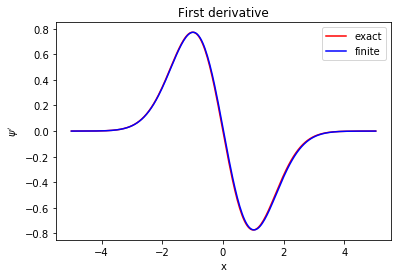

In [31]:
# Plot the figure
dpsi_exact = alpha * (-1) * x * psi
plt.plot(x,dpsi_exact,'r')
plt.plot(x,np.real(dpsi_finite),'b')
plt.xlabel("x")
plt.ylabel(r"$\psi' $")
plt.title('First derivative')
plt.legend(['exact','finite'])
plt.show()

In [32]:
# calculate and compare two methods' maxminum errors
max_error_finite_1st  = np.max(abs(dpsi_exact - dpsi_finite))
max_error_fourier_1st = max_error_f(N)[0]
print(f"Finite Method's error is {max_error_finite_1st}\nFourier Method's error is {max_error_fourier_1st}")

Finite Method's error is 0.02513667340089107
Fourier Method's error is 0.0030289981073838845


For first derivatives, the Fourier method is more precise than the finite-difference method at N = 256.

For the second derivative.

In [29]:
ddpsi_finite = np.zeros_like(x)
for i in range(len(x)):
    ddpsi_finite[i] = 1 / (dx ** 2) * (psi_function(x[i]+dx) - 2 * psi_function(x[i]) + psi_function(x[i]-dx))

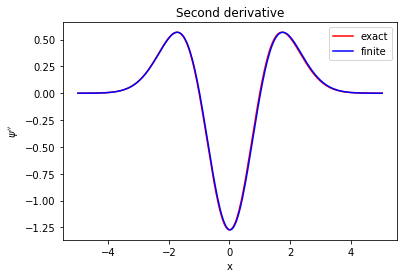

In [33]:
# Plot the figure
ddpsi_exact = alpha * (-1) * ( psi + x * dpsi_exact)
plt.plot(x,ddpsi_exact,'r')
plt.plot(x,np.real(ddpsi_finite),'b')
plt.xlabel("x")
plt.ylabel(r"$\psi'' $")
plt.title('Second derivative')
plt.legend(['exact','finite'])
plt.show()

In [36]:
# calculate and compare two methods' maxminum errors
max_error_finite_2nd  = np.max(abs(ddpsi_exact - ddpsi_finite))
max_error_fourier_2nd = max_error_f(N)[1]
print(f"Finite Method's error is {max_error_finite_2nd}\nFourier Method's error is {max_error_fourier_2nd}")

Finite Method's error is 0.039650685445323575
Fourier Method's error is 0.010005768552289629


For second order differentiation, at N = 256, the Fourier method is on the same order of magnitude as the finite-difference method, but the Fourier method is slightly more precise than the finite-difference method

### Problem 6 ———— 黄家乐

In [48]:
def ode_function(w,t,a,b,c):
    x,y,z = w
    return np.array([a*(y-x),(c-a)*x-x*z+c*y,x*y-b*z])

In [67]:
t = np.arange(0, 10, 0.001)

I met some problems in solving this problem. They told me that when $a=40,b=5,c=35$, I will get a chaotic solution. However, when I ran the program, I found that I would get something like a periodic solution under these conditions.I've plotted them down here. And you can see from these graphs, they don't match the graph that they gave us.

In [116]:
result_0 = odeint(ode_function,(-10,0,35),t,args = (40,5,35))

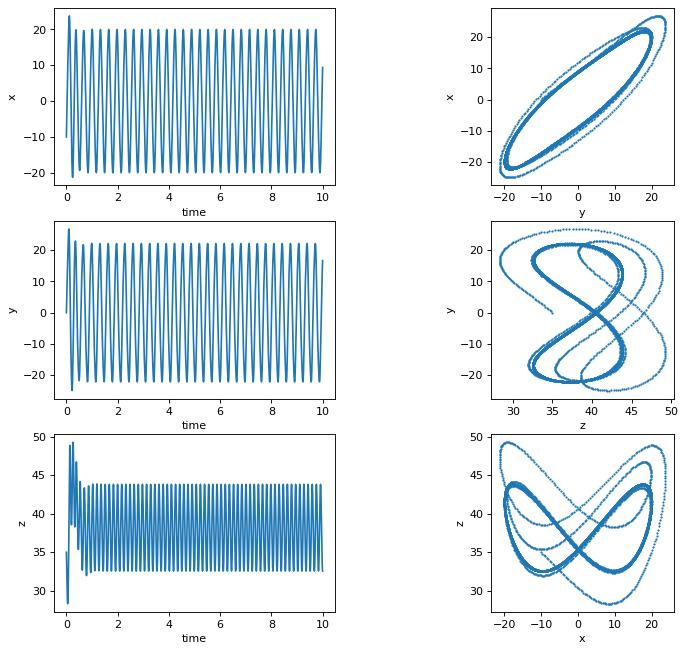

In [117]:
plt.figure(figsize=(10,10),dpi=80)

plt.subplot(321)
plt.plot(t,result_0[:,0])
plt.xlabel('time')
plt.ylabel('x')

plt.subplot(333)
plt.scatter(result_0[:,0],result_0[:,1],s=1)
plt.xlabel('y')
plt.ylabel('x')

plt.subplot(323)
plt.plot(t,result_0[:,1])
plt.xlabel('time')
plt.ylabel('y')

plt.subplot(336)
plt.scatter(result_0[:,2],result_0[:,1],s=1)
plt.xlabel('z')
plt.ylabel('y')

plt.subplot(325)
plt.plot(t,result_0[:,2])
plt.xlabel('time')
plt.ylabel('z')

plt.subplot(339)
plt.scatter(result_0[:,0],result_0[:,2],s=1)
plt.xlabel('x')
plt.ylabel('z')

plt.show()

I think the reason for this is that they gave the wrong values for "a, b, c", So I did some experiments and found that when $a=46$, the result is very similar to the picture and the problem.

In [118]:
result_1 = odeint(ode_function,(-10,0,35),t,args = (46,5,35))

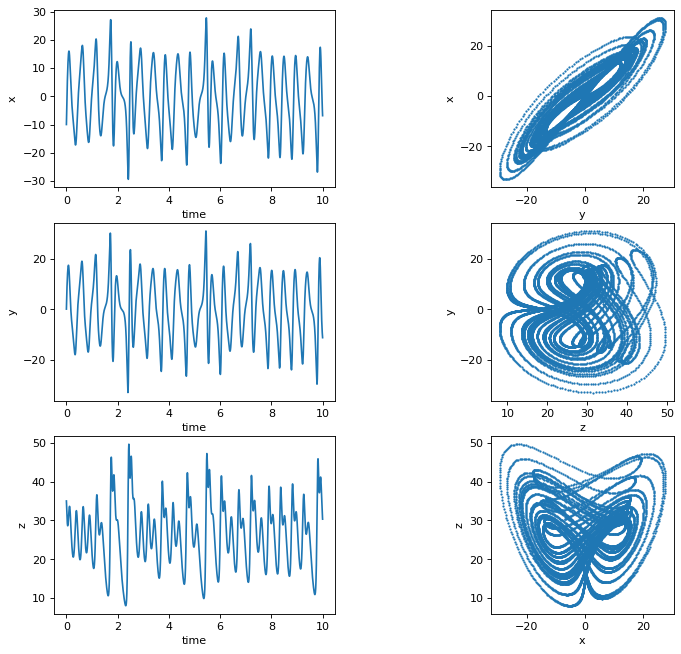

In [119]:
plt.figure(figsize=(10,10),dpi=80)

plt.subplot(321)
plt.plot(t,result_1[:,0])
plt.xlabel('time')
plt.ylabel('x')

plt.subplot(333)
plt.scatter(result_1[:,0],result_1[:,1],s=1)
plt.xlabel('y')
plt.ylabel('x')

plt.subplot(323)
plt.plot(t,result_1[:,1])
plt.xlabel('time')
plt.ylabel('y')

plt.subplot(336)
plt.scatter(result_1[:,2],result_1[:,1],s=1)
plt.xlabel('z')
plt.ylabel('y')

plt.subplot(325)
plt.plot(t,result_1[:,2])
plt.xlabel('time')
plt.ylabel('z')

plt.subplot(339)
plt.scatter(result_1[:,0],result_1[:,2],s=1)
plt.xlabel('x')
plt.ylabel('z')

plt.show()

Here, we get chaotic solutions like those shown in pdf.

Then we set $b = 10$  while keeping $a=46$ and $c= 35$ yields periodic solutions.

In [120]:
result_2 = odeint(ode_function,(-10,0,35),t,args = (46,10,35))

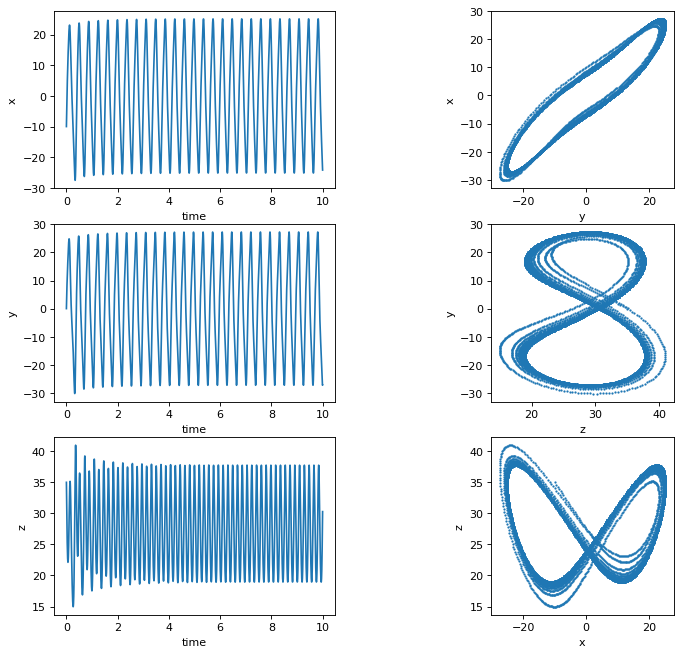

In [121]:
plt.figure(figsize=(10,10),dpi=80)

plt.subplot(321)
plt.plot(t,result_2[:,0])
plt.xlabel('time')
plt.ylabel('x')

plt.subplot(333)
plt.scatter(result_2[:,0],result_2[:,1],s=1)
plt.xlabel('y')
plt.ylabel('x')

plt.subplot(323)
plt.plot(t,result_2[:,1])
plt.xlabel('time')
plt.ylabel('y')

plt.subplot(336)
plt.scatter(result_2[:,2],result_2[:,1],s=1)
plt.xlabel('z')
plt.ylabel('y')

plt.subplot(325)
plt.plot(t,result_2[:,2])
plt.xlabel('time')
plt.ylabel('z')

plt.subplot(339)
plt.scatter(result_2[:,0],result_2[:,2],s=1)
plt.xlabel('x')
plt.ylabel('z')

plt.show()

Here we get yields periodic solutions